<img src="./materiales/urjc_logo.png" width="200" height="100" align="right"/>

# <span style="color:darkcyan"> Práctica 1: Filtrado y mejora de imagen médica  </span>

<div style="text-align: center"><font size="3"><i><b>Jupyter Notebook elaborado por: David María Arribas, Paula Sánchez Tirado y Katherine Coutinho García</b></i></font></div>

<div class="warning" style=' background-color:#c4fbff'>
<span><font size="4">
<p style='margin-top:1em; text-align:center'>
<b>Implementación</b></p>
</font>
</span>
</div>

## <span style="color:darkcyan">REPOSITORIO GITHUB</span>

En el siguiente enlace se encuentra el repositorio GitHub donde se han almacenado todos los resultados obtenidos de esta práctica. https://github.com/dmariaa/MUVA_IM_practica1

In [1]:
# Descomentar para obtener los gráficos en ventanas independientes
# %matplotlib tk
import cv2.cv2 as cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from noise import add_noise, NoiseTypes
from dif_aniso import dif_aniso, dif_aniso_mc
from nlm_filter import nlm

In [2]:
def read_image(file):
    image = cv2.imread(file, cv2.COLOR_BGR2GRAY)
    image = image.astype(np.float64)
    return image

# <span style="color:darkcyan">EJERCICIO 1</span>

## <span style="color:darkcyan"> Ejercicio 1.1: Filtrado anisotrópico un solo canal  </span>

Se he implementado en python, dentro de dif_aniso.py la función matlab que se incluye como parte de los ejercicios.

###  <span style="color:darkcyan"> - Determinando el parámetro K</span>

Para determinar el valor del parámetro K, se han generado las imágenes de gradientes en las 4 direcciones y se ha analizado el valor del gradiente en las zonas de bajo contraste cuyos bordes queremos mantener.

De esta forma hemos determinado que el valor que búscamos para el parámetro K es 8.

<ipython-input-3-587c7bcee55e>:22: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


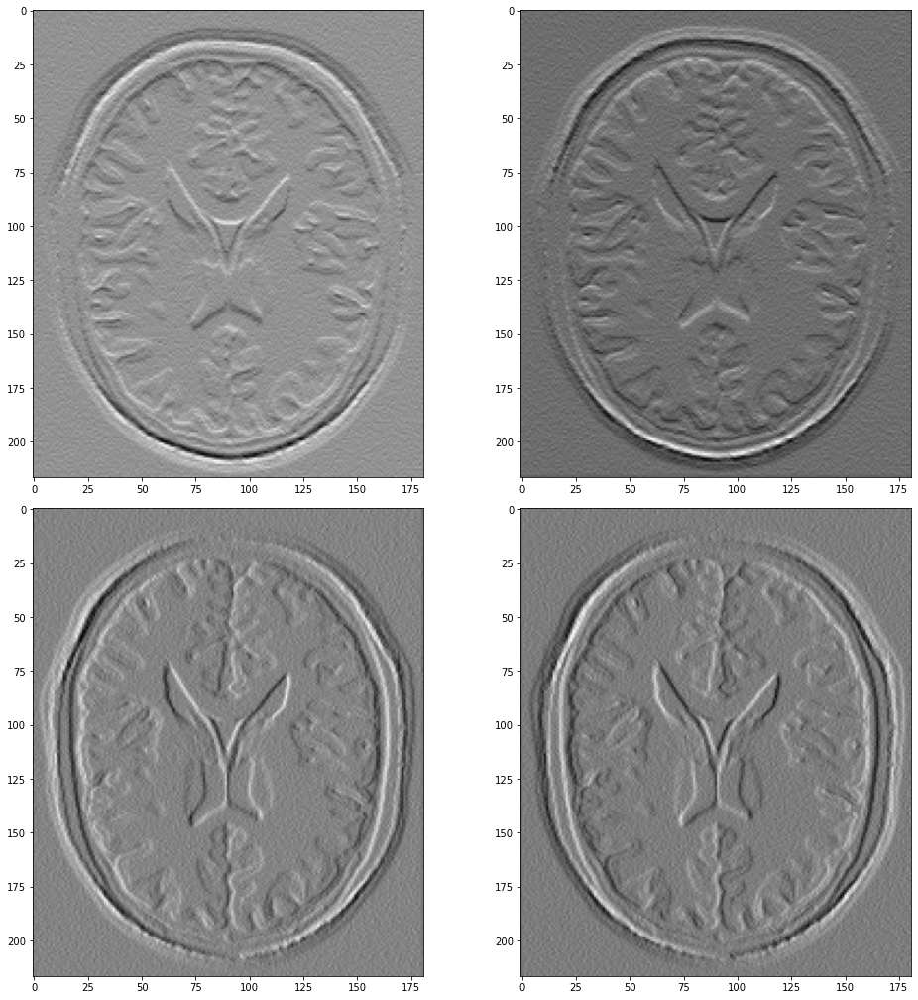

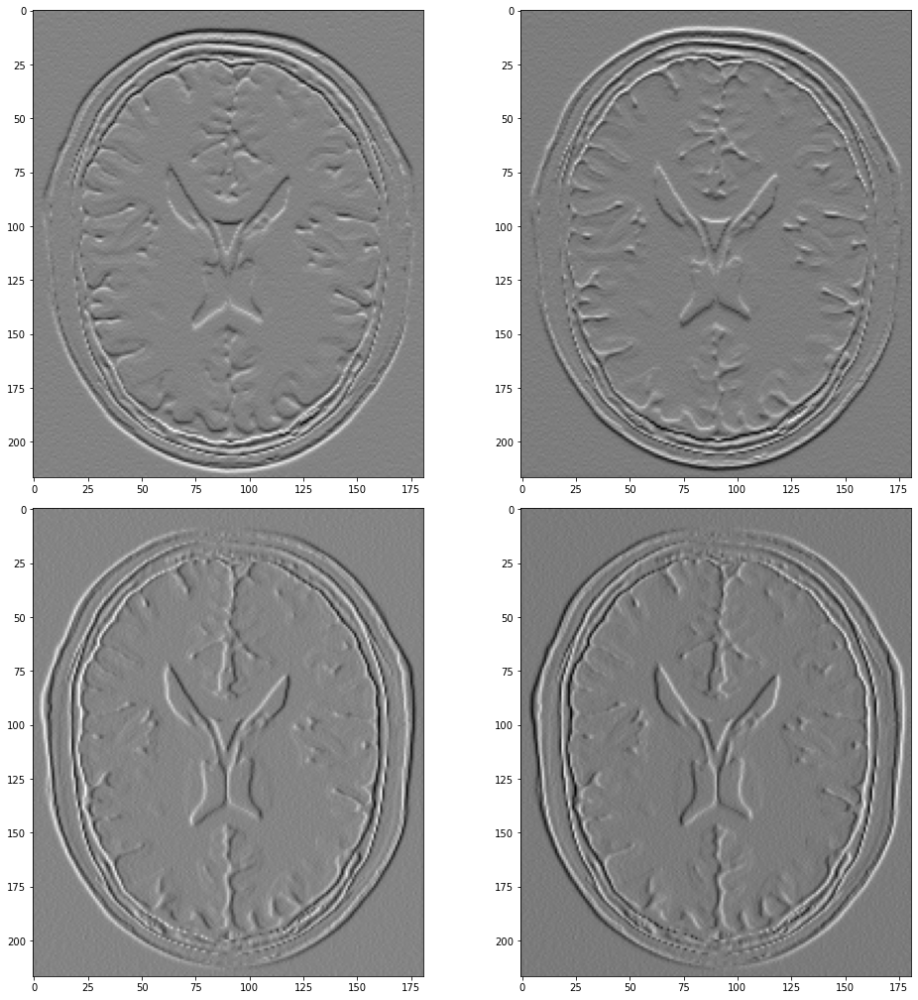

In [3]:
def show_gradients(image_file):
    image = read_image(image_file)
    image = add_noise(image=image, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)
    rows, cols = image.shape

    # pads image with zeros
    imdifm = np.pad(image, (1,), constant_values=0, mode='constant')

    # gradients in 4 directions
    deltaN = imdifm[0:rows, 1:cols + 1] - image
    deltaS = imdifm[2:rows + 2, 1:cols + 1] - image
    deltaE = imdifm[1:rows + 1, 2:cols + 2] - image
    deltaW = imdifm[1:rows + 1, 0:cols] - image

    fig, ax = plt.subplots(2, 2, figsize=(14.4, 14.4), tight_layout={
        'rect': [0, 0, 1, 0.98] }
    )
    ax[0,0].imshow(deltaN, cmap='gray')
    ax[0,1].imshow(deltaS, cmap='gray')
    ax[1,0].imshow(deltaE, cmap='gray')
    ax[1,1].imshow(deltaW, cmap='gray')
    fig.show()

show_gradients("materiales/T1.png")
show_gradients("materiales/T2.png")

###  <span style="color:darkcyan"> - Realizando el filtrado en T1.png</span>

Se ha realizado y presentado el filtrado en T1.png con el parámetro K deducido con el método anteriormente comentado y numero de iteraciones y valor de lambda probados de forma empírica.

<ipython-input-4-63e185eb61f4>:16: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


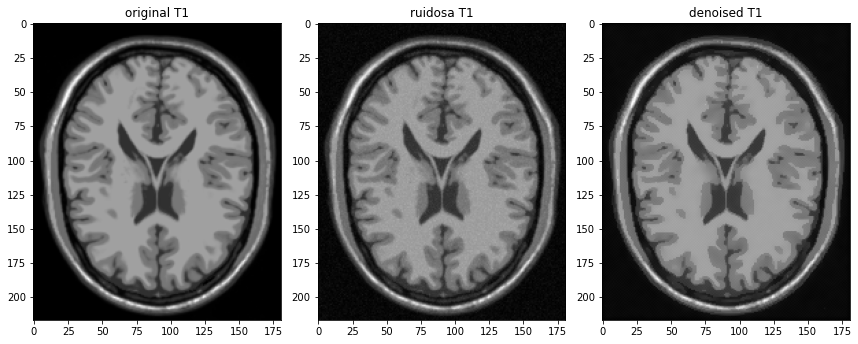

In [4]:
def filter_image(image_file):
    imageT1 = read_image(image_file)
    noise_image = add_noise(image=imageT1, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)
    denoised_image = dif_aniso(im=noise_image, niter=10, k=8, l=0.40, option=1)

    fig, ax = plt.subplots(1, 3, figsize=(12, 10), tight_layout={
            'rect': [0, 0, 1, 0.98]
        }
    )
    ax[0].imshow(imageT1, cmap='gray')
    ax[0].set_title('original T1')
    ax[1].imshow(noise_image, cmap='gray')
    ax[1].set_title('ruidosa T1')
    ax[2].imshow(denoised_image, cmap='gray')
    ax[2].set_title("denoised T1")
    fig.show()

filter_image("materiales/T1.png")

Y hacemos lo mismo para T2.

<ipython-input-4-63e185eb61f4>:16: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


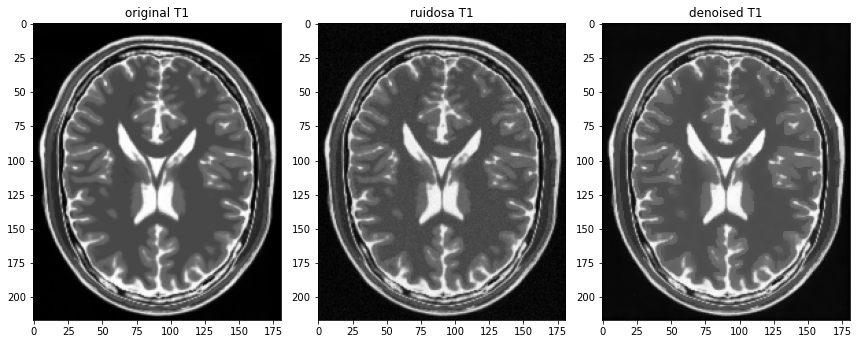

In [5]:
filter_image("materiales/T2.png")

## <span style="color:darkcyan"> Ejercicio 1.2: Filtrado anisotrópico multicanal  </span>

Se ha modificado la función dif_aniso (ahora dif_aniso_mc) para aceptar dos imágenes, y realizar el cálculo del coeficiente empleando la fórmula propuesta por Gerig, Kikins, Kübler y Jolesz:

$$ c(\vec{x}, t) = \sqrt{\nabla I_1^2 + \nabla I_2^2} $$

Y generado la salida empleando ambas imágenes.

Y generado la salida empleando ambas imágenes.

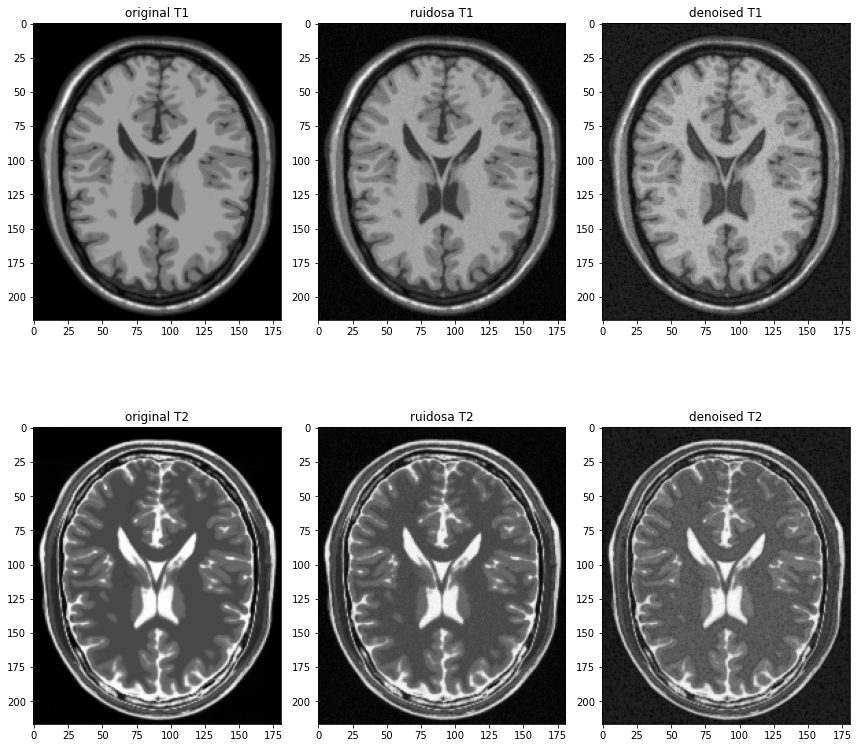

In [6]:
def filter_images(image_file1, image_file2):
    image1 = read_image(image_file1)
    image2 = read_image(image_file2)
    noise_image1 = add_noise(image=image1, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)
    noise_image2 = add_noise(image=image2, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)
    denoised_image1, denoised_image2 = dif_aniso_mc(im1=noise_image1, im2=noise_image2, niter=10, k=8, l=0.25, option=1)

    fig, ax = plt.subplots(2, 3, figsize=(12, 12), tight_layout={
            'rect': [0, 0, 1, 0.98]
        }
    )
    ax[0,0].imshow(image1, cmap='gray')
    ax[0,0].set_title('original T1')
    ax[0,1].imshow(noise_image1, cmap='gray')
    ax[0,1].set_title('ruidosa T1')
    ax[0,2].imshow(denoised_image1, cmap='gray')
    ax[0,2].set_title("denoised T1")

    ax[1,0].imshow(image2, cmap='gray')
    ax[1,0].set_title('original T2')
    ax[1,1].imshow(noise_image2, cmap='gray')
    ax[1,1].set_title('ruidosa T2')
    ax[1,2].imshow(denoised_image2, cmap='gray')
    ax[1,2].set_title("denoised T2")

filter_images("materiales/T1.png", "materiales/T2.png")

# <span style="color:darkcyan">EJERCICIO 2</span>

En este ejercicio se pide implementar el algoritmo Non Local Means para el filtrado de imágenes médicas. Este se encuentra en el fichero NLM_filter.py. 

Para poder aplicar el filtro, primero es necesario poseer una imagen con ruido, por lo que a nuestra imagen original le añadimos este. Se encuentra en el archivo noise.py.

A continuación, se muestran las funciones creadas para este ejercicio.

In [7]:
def filter_NLM(image_file, ws, h):
    
    image = cv2.imread(image_file, cv2.COLOR_BGR2GRAY)
    image = image.astype(np.float64)
    noise_image = add_noise(image=image, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)
    denoised_image = nlm(noise_image, ws, h)     
        
    fig, ax = plt.subplots(1, 3, figsize=(12, 12), tight_layout={
            'rect': [0, 0, 1, 0.98]
        }
    )
    ax[0].imshow(image, cmap='gray')
    ax[0].set_title('Imagen original')
    ax[1].imshow(noise_image, cmap='gray')
    ax[1].set_title('Imagen ruidosa')
    ax[2].imshow(denoised_image, cmap='gray')
    ax[2].set_title("Imagen filtrada con NLM")
    

In [8]:
def filter_gaussian(image_file, kernel):
    
    image = cv2.imread(image_file, cv2.COLOR_BGR2GRAY)
    image = image.astype(np.float64)
    noise_image = add_noise(image=image, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)   
    denoised_image = cv2.GaussianBlur(noise_image, kernel, 0)
    
    fig, ax = plt.subplots(1, 3, figsize=(12, 12), tight_layout={
            'rect': [0, 0, 1, 0.98]
        }
    )
    ax[0].imshow(image, cmap='gray')
    ax[0].set_title('Imagen original')
    ax[1].imshow(noise_image, cmap='gray')
    ax[1].set_title('Imagen ruidosa')
    ax[2].imshow(denoised_image, cmap='gray')
    ax[2].set_title("Imagen filtrada con filtro gaussiano")

In [9]:
def filter_dif_aniso(image_file):
    image = cv2.imread(image_file, cv2.COLOR_BGR2GRAY)
    image = image.astype(np.float64)
    noise_image = add_noise(image=image, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)
    denoised_image = dif_aniso(im=noise_image, niter=10, k=8, l=0.40, option=1)

    fig, ax = plt.subplots(1, 3, figsize=(8.4, 14.4), tight_layout={
            'rect': [0, 0, 1, 0.98]
        }
    )
    ax[0].imshow(image, cmap='gray')
    ax[0].set_title('Imagen original')
    ax[1].imshow(noise_image, cmap='gray')
    ax[1].set_title('Imagen ruidosa')
    ax[2].imshow(denoised_image, cmap='gray')
    ax[2].set_title("Imagen filtrada con filtro Perona y Malik")

In [10]:
def compare(image_file):
    
    image = cv2.imread(image_file, cv2.COLOR_BGR2GRAY)
    image = image.astype(np.float64)
    noise_image = add_noise(image=image, noise_type=NoiseTypes.RICIAN_NOISE, intensity=0.1)
    denoised_NLM = nlm(noise_image, 3, 0.5)
    denoised_blur = cv2.GaussianBlur(noise_image, (5, 5), 0)
    denoised_dif_aniso = dif_aniso(im=noise_image, niter=10, k=8, l=0.40, option=1)
    
    fig, ax = plt.subplots(2, 3, figsize=(12, 12), tight_layout={
            'rect': [0, 0, 1, 0.98]
        }
    )
    ax[0, 0].imshow(image, cmap='gray')
    ax[0, 0].set_title('Imagen original')
    ax[0, 1].imshow(noise_image, cmap='gray')
    ax[0, 1].set_title('Imagen ruidosa')
    ax[0, 2].axis('off')
    ax[1, 0].imshow(denoised_NLM, cmap='gray')
    ax[1, 0].set_title("Imagen filtrada con NLM")
    ax[1, 1].imshow(denoised_blur, cmap='gray')
    ax[1, 1].set_title('Imagen filtrada con filtro gaussiano')
    ax[1, 2].imshow(denoised_dif_aniso, cmap='gray')
    ax[1, 2].set_title('Imagen filtrada con filtro de Perona y Malik')
    

###  <span style="color:darkcyan"> - 1. Conceptos previos</span>

Como se ha visto, el método Non-Local Means (NLM) consiste en filtrar la imagen por media ponderada de los diferentes píxeles de la imagen en función de su similitud con el píxel original.

Para cumplir con esta parte de la práctica se implementará el algoritmo básico de NLM con parches de tamaño variable alrededor del píxel que se quiere comparar. 

####  Algoritmo Non-Local Means

Este método consiste en calcular el valor de cada píxel mediante el promedio ponderado de todos los píxeles de la imagen en función de la similitud que tengan con respecto el píxel a filtrar. Por lo tanto, en lugar de calcular el promedio de los vecinos dentro de la propia sub-imagen, se busca un parche que sea similar a la sub-imagen  inicial con la que filtrar. 

De forma matemática:

$$
\quad NL[v](i) = \sum_{j∈l} w(i,j)v(j)
$$


- w(i,j) = depende de la similitud entre el píxel a filtrar v(i) y el píxel con el que se está comparando v(j).

El píxel debe ser similar a píxeles similares, no necesariamente a sus vecinos. w(i, j) se calcula de la siguiente forma:

$$
\quad w(i,j) = \frac{1}{Z(i)} \exp ^(\frac{-d(i,j)}{h^2})
$$

- $ h^2 $: parámetro de similitud asociado al grado de filtrado

- d(i,j) = distancia euclídea entre los píxeles de un parche centrado en v(i, j) y los de otro centrado en v(j). 

$$
\quad d(i,j) = || v(N_i) - v(N_j) ||^2 = \sqrt{\sum_{i = 1}^{n} (p_i - q_i)^2}
$$

Para normalizar el valor final utilizamos: 

$$
\quad Z(i) = \sum_{∀j} \exp^(\frac{-d(i,j)}{h^2})
$$

A continuación, se aplica el algoritmo a nuestras imágenes ruidosas. 

###  <span style="color:darkcyan"> - 2. Aplicación de distintos filtros a imágenes médicas ruidosas</span>

Para comparar el filtrado de Non-Local Means, se utilizarán también un filtro gaussiano y el filtro de Perona y Malik. Comenzaremos con el filtro de Non-Local Means. 

#### 2.1. Non-Local Means

Comenzaremos variando el parámetro h.

##### Variación del parámetro h

- h = 0.5

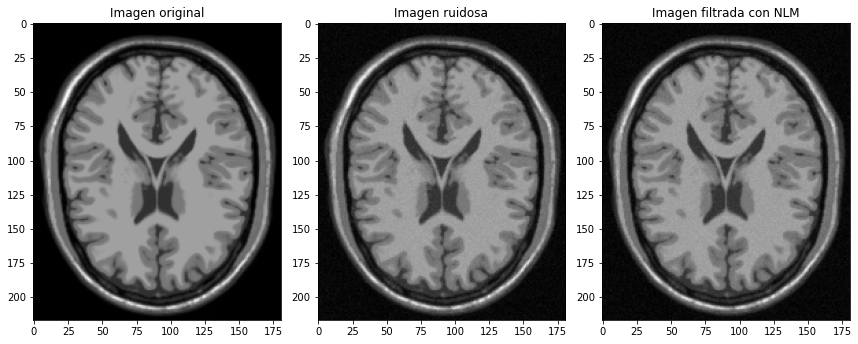

In [11]:
filter_NLM('materiales/T1.png', 3, 0.5)

- h = 5

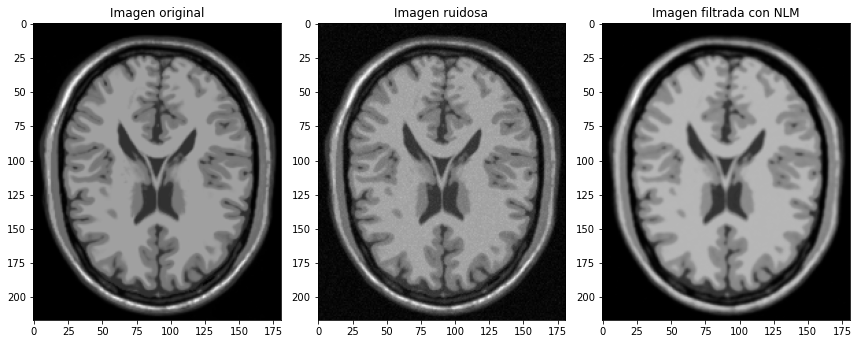

In [12]:
filter_NLM('materiales/T1.png', 3, 5)

- h = 10

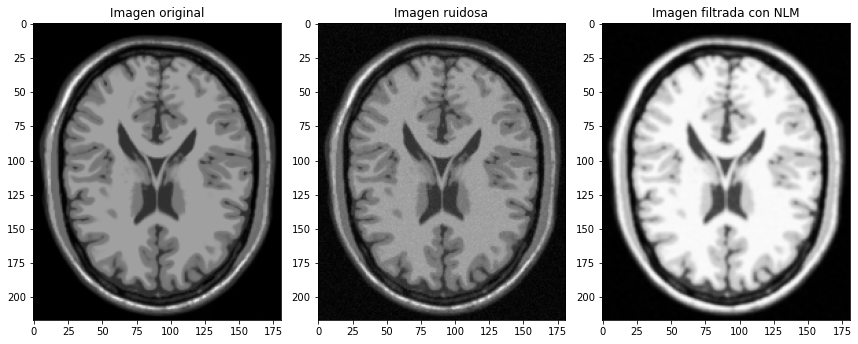

In [13]:
filter_NLM('materiales/T1.png', 3, 10)

- h = 50

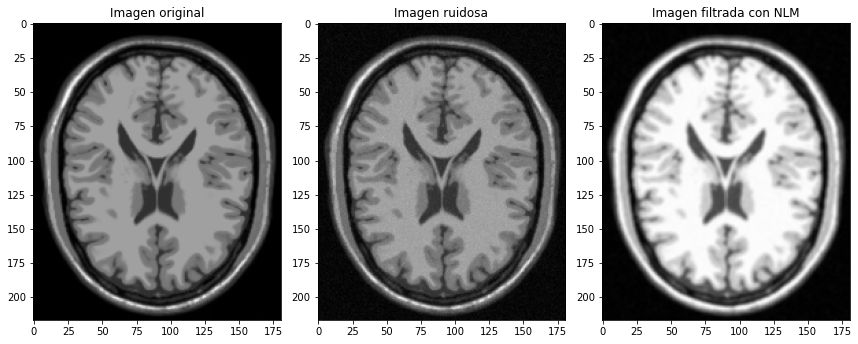

In [14]:
filter_NLM('Materiales/T1.png', 3, 50)

#### Variación del tamaño del parche

- ws = 3

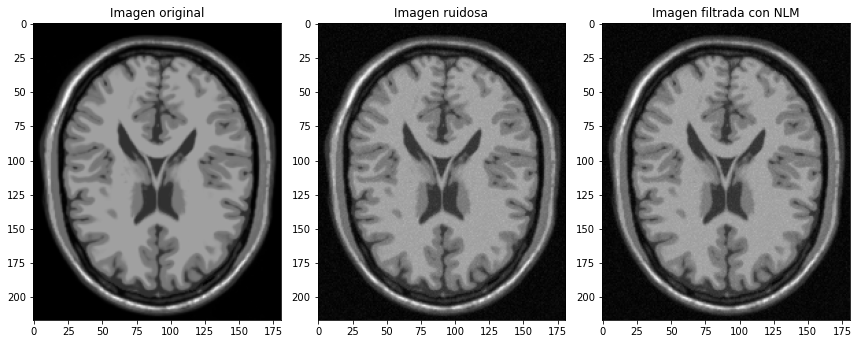

In [15]:
filter_NLM('Materiales/T1.png', 3, 0.5)

- ws = 5

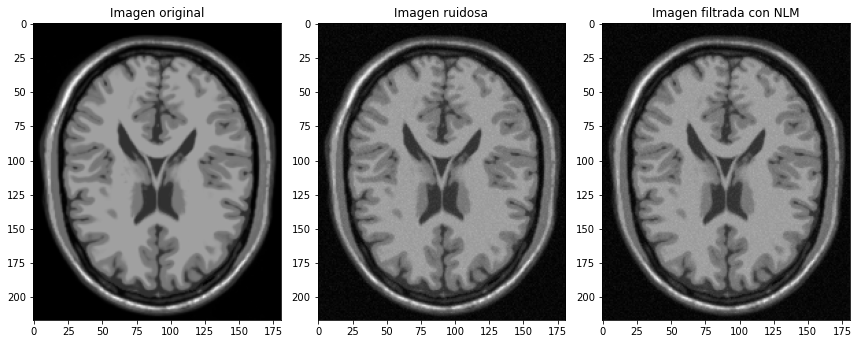

In [16]:
filter_NLM('Materiales/T1.png', 5, 0.5)

- ws = 7

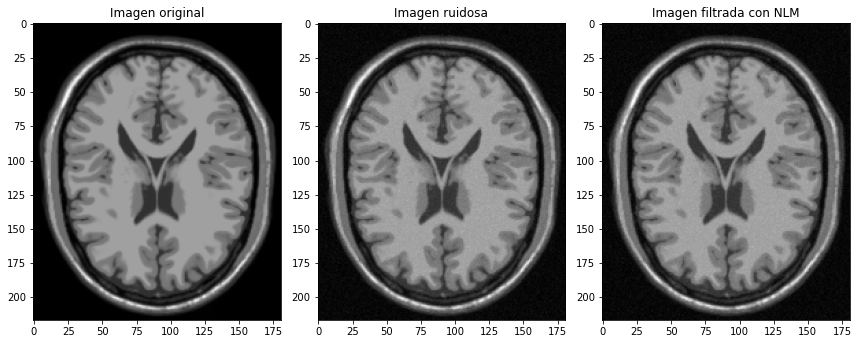

In [17]:
filter_NLM('Materiales/T1.png', 7, 0.5)

En cuanto al parámetro h, se observa que, a medida que aumenta, aunque se elimina mejor el ruido, la imagen queda más emborronada, sin preservar los bordes, por lo que escogeremos un h de 0'5. Por otra parte, a medida que se aumenta el tamaño de la ventana, no existe una diferencia significativa en la eliminación de ruido de la imagen. Además, a mayor tamaño de ventana, mayor tiempo de cómputo. Por lo tanto, el mejor valor para esta imagen en concreto, es mejor un tamaño de 3x3. 

Por otra parte, podemos afirmar que se trata de un algoritmo lento, ya que tarda unos minutos en ejecutarse. 

#### 2.2. Filtro gaussiano

Para este filtro se comprobarán distintos kernels hasta encontrar el kernel más óptimo para estas imágenes médicas. 

- Kernel: 3x3

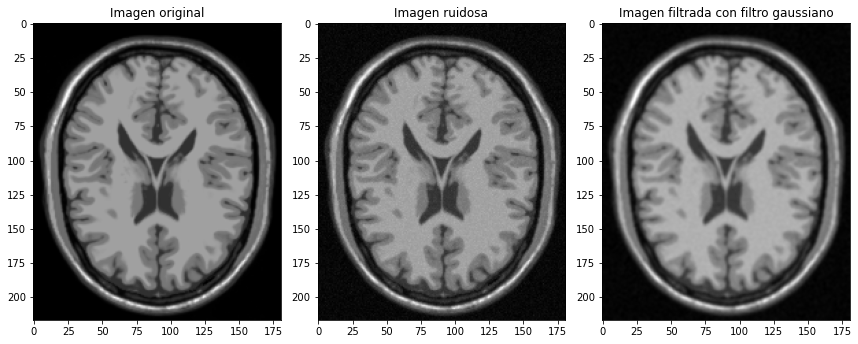

In [18]:
filter_gaussian('Materiales/T1.png', (3, 3))

- Kernel: 5x5

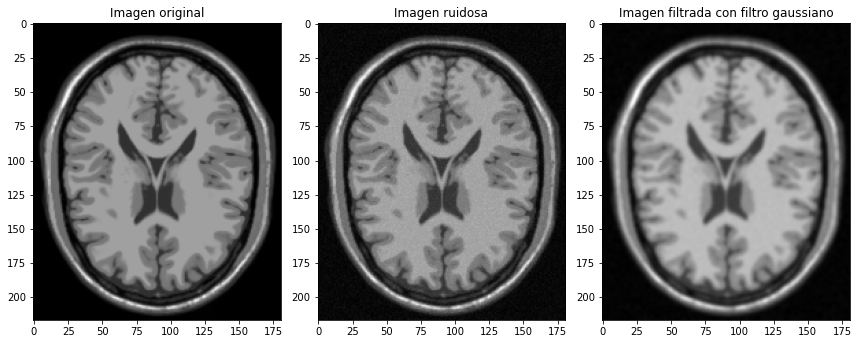

In [19]:
filter_gaussian('Materiales/T1.png', (5, 5))

- Kernel: 7x7

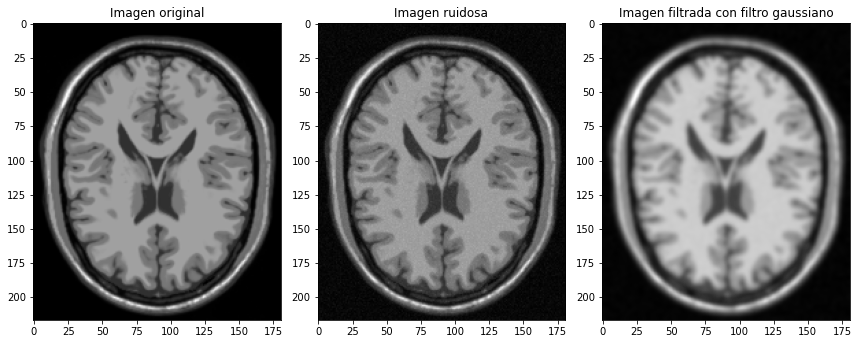

In [20]:
filter_gaussian('Materiales/T1.png', (7, 7))

- Kernel: 11x11

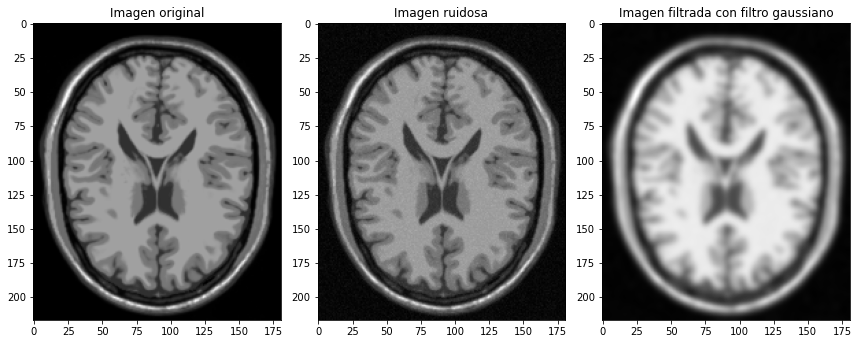

In [21]:
filter_gaussian('Materiales/T1.png', (11, 11))

A medida que aumentamos el kernel, la imagen se vuelve más borrosa, aunque elimine el ruido de la imagen. Para estas imágenes, el kernel más apropiado es 3x3. 

#### 2.3. Filtro de Perona y Malik

Para este algoritmo no será necesario buscar los parámetros más apropiados, ya que esto se ha realizado en el ejercicio anterior. Por lo tanto, se comparará en el próximo apartado los tres filtros creados.

###  <span style="color:darkcyan"> - 3. Comparación entre filtros</span>

A continuación, se compararán las imágenes ruidosas aplicando los tres filtros diseñados.

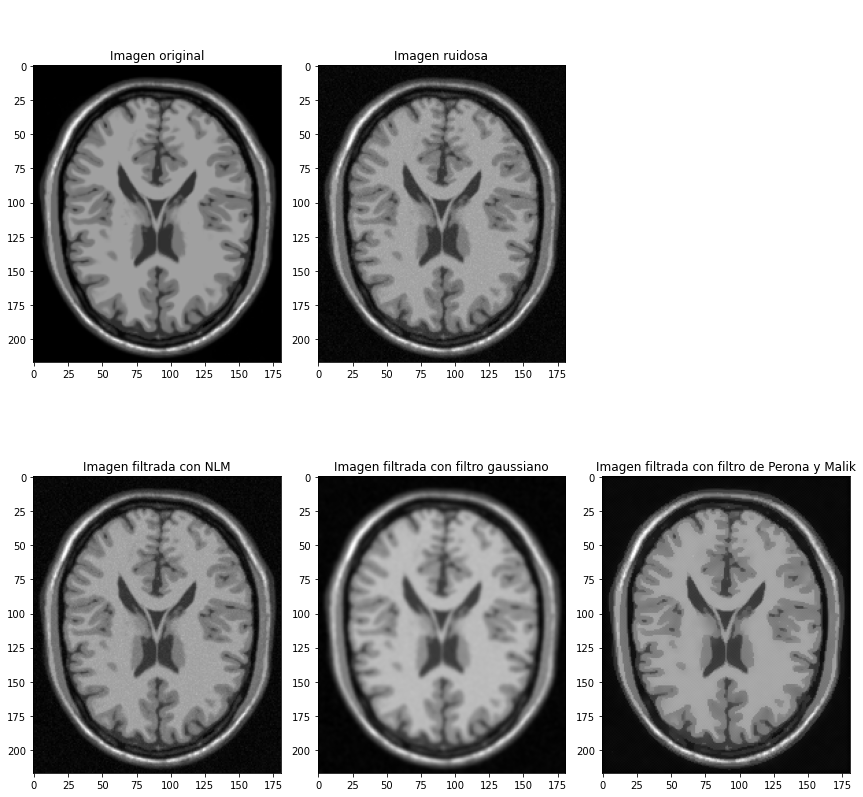

In [22]:
compare('Materiales/T1.png')

Se observan algunas diferencias entre los filtros implementados. La principal diferencia es el emborronamiento de los bordes. El filtro gaussiano provoca un emborronamiento mayor de la imagen. Este no consigue preservar adecuadamente los bordes, mientras que los otros dos sí lo logran.  

Por su parte, el filtro NLM permite analizar y comparar píxeles por su similitud y no por sus ubicaciones adyacentes, por lo que no se pierde tanta información en los bordes, como sí ocurre con el filtro gaussiano, ya explicado.

Asimismo, el filtro de Perona y Malik funciona dependiendo del gradiente de la imagen. Las zonas con gradiente elevado (bordes) sufren una menor difusión que zonas con un gradiente más bajo. Este consigue eliminar mejor el ruido, en comparación con los otros dos filtros implementados, aunque preserva algo peor los bordes en comparación con el filtro NLM. Sin embargo, no es una pérdida demasiado notoria. 

# <span style="color:darkcyan">EJERCICIO 3</span>

Se analizó el efecto de cada parámetro asociado al algortimo N4ITK MRI Bias Field Correction en 3D Slicer, obteniendo los siguientes resultados:


### - BSpline grid resolution

- resolución = (1,1,1)

Text(0.5, 1.0, 'Imagen corregida')

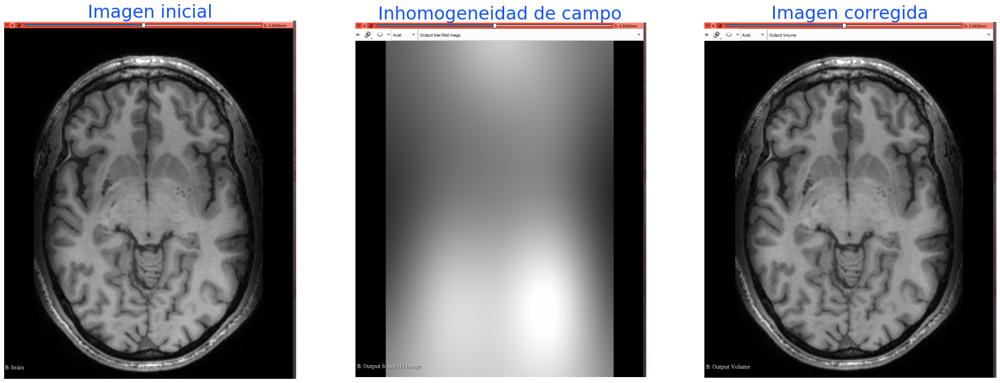

In [23]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/field_1.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/filtered_1.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

- resolución = (4,4,4)

Text(0.5, 1.0, 'Imagen corregida')

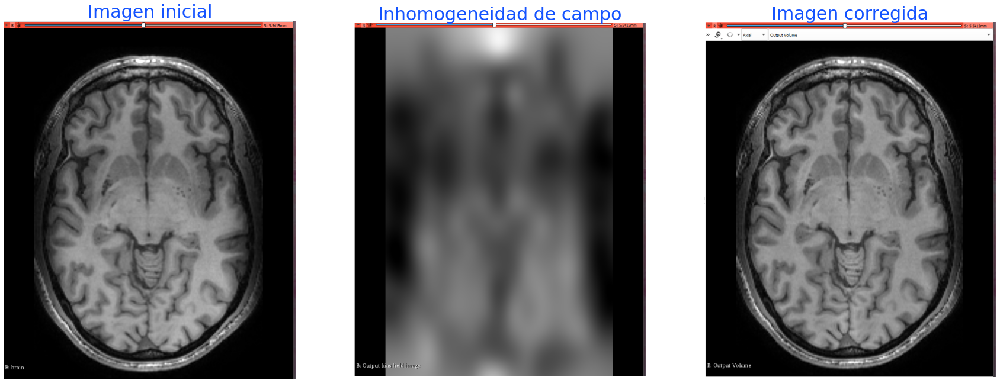

In [24]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/field_4.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/filtered_4.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

- resolución = (8,8,8)

Text(0.5, 1.0, 'Imagen corregida')

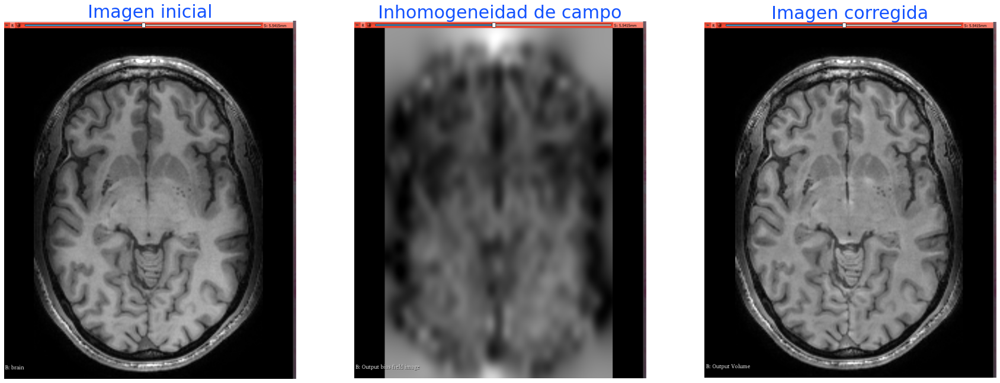

In [25]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/field_8.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/bspline_res/filtered_8.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

Como se puede apreciar en los ejemplos presentados previamente, a mayor resolución del Bspline grid, mayor corrección se visualiza en la imagen de salida, reduciéndose drásticamente la presencia de irregularidades en la iluminación, inicialmente originadas por la presencia de inhomogeneidad de campo.

### - Spline distance

-  spline distance = 5

Text(0.5, 1.0, 'Imagen corregida')

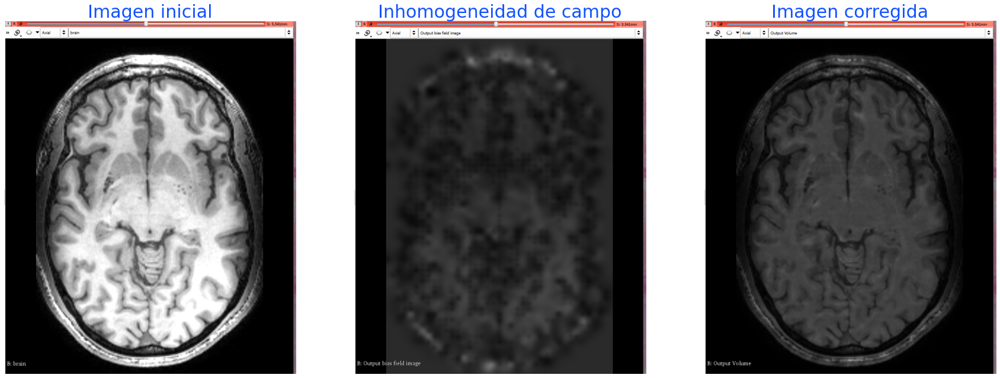

In [2]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/dist_5_field.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/dist_5_filtered.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

-  spline distance = 10

Text(0.5, 1.0, 'Imagen corregida')

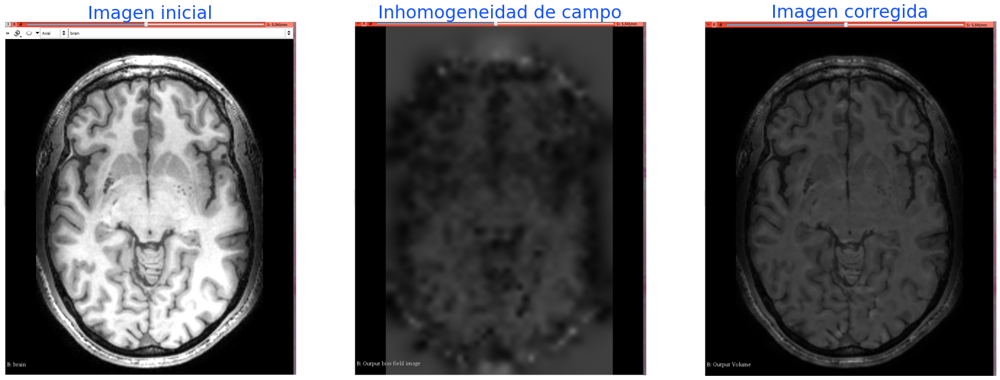

In [3]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/dist_10_field.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/dist_10_filtered.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

-  spline distance = 50

Text(0.5, 1.0, 'Imagen corregida')

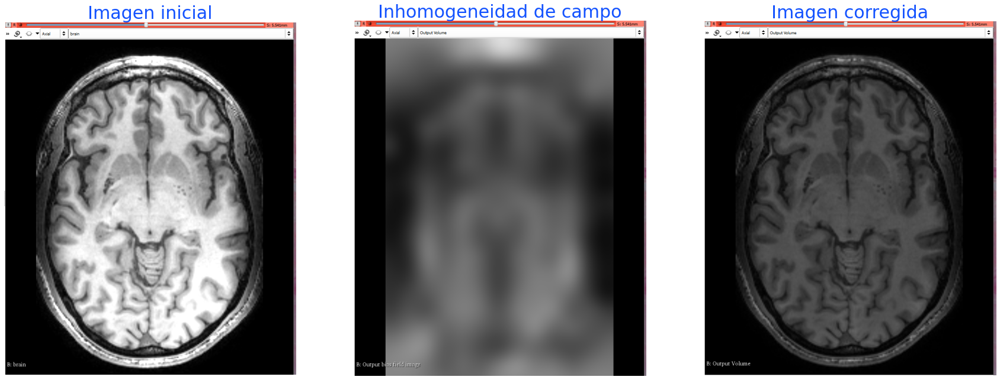

In [4]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/dist_50_field.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/distance/dist_50_filtered.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

Según la documentación del algoritmo N4ITK MRI Bias correction, el parámetro **Spline distance** ofrece un medio alternativo para definir la cuadrícula de spline, estableciendo la distancia entre los puntos de control. Como puede apreciarse en los ejemplos previos, a mayor valor, mejor se captura la inhomogenidad de campo y por tanto, mejor es el resultado de la corrección.

### - Bias field Full Width at Half Maximum

-  Bias field Full Width at Half Maximum = 2

Text(0.5, 1.0, 'Imagen corregida')

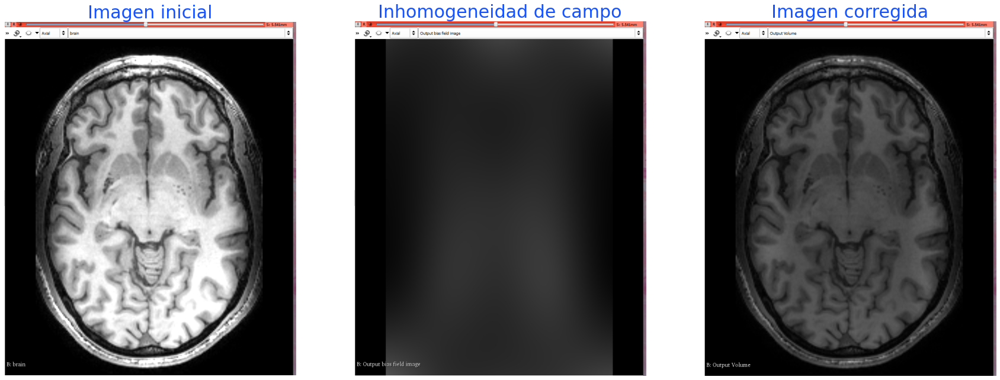

In [5]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/full_2_field.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/full_2_filtered.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

-  Bias field Full Width at Half Maximum = 5

Text(0.5, 1.0, 'Imagen corregida')

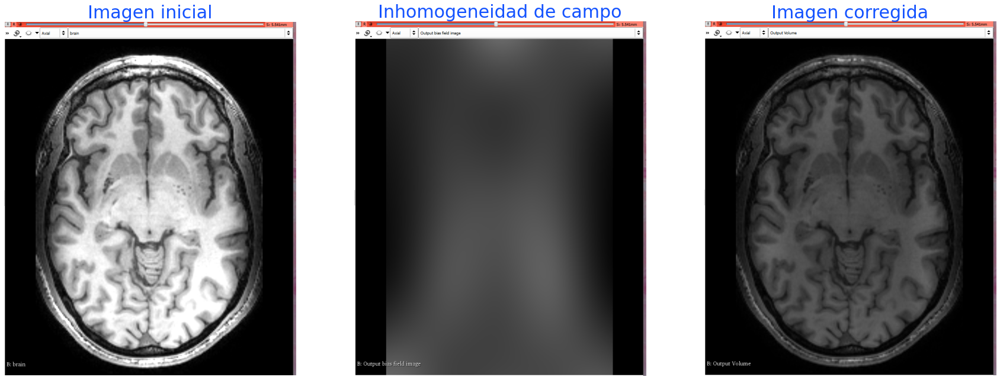

In [6]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/full_5_field.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/full_5_filtered.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

-  Bias field Full Width at Half Maximum = 10

Text(0.5, 1.0, 'Imagen corregida')

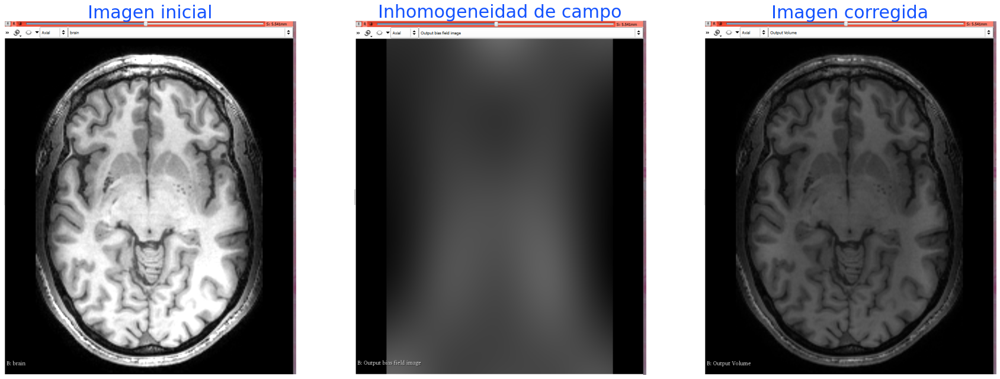

In [7]:
plt.figure(figsize=(30, 20))

plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/original.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen inicial', color='#1453ff', size=30)

plt.subplot(1, 3, 2)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/full_10_field.png"), cv2.COLOR_BGR2RGB))
plt.title('Inhomogeneidad de campo', color='#1453ff', size=30)

plt.subplot(1, 3, 3)
plt.axis('off')
plt.imshow(cv2.cvtColor(cv2.imread("./materiales/3d_slicer/full_width/full_10_filtered.png"), cv2.COLOR_BGR2RGB))
plt.title('Imagen corregida', color='#1453ff', size=30)

Como puede observarse a partir de los ejemplos presentados previamente, en este caso no fue posible caracterizar la inhomogenidad de campo adecuadamente. No obstante, se puede apreciar que de los valores otorgados, el que mejor corrección proporciona es el mayor valor establecido (Bias field Full Width at Half Maximum = 10).

### - Parámetros avanzados

A continuación, se comentarán los parámetros avanzados del módulo MRI Bias Field Correction. 

<img src="./materiales/3D_Slicer/advanced_params.jpg" width="400" height="400" align="center"/>

- **Número de iteraciones**: número máximo de iteraciones en cada nivel de resolución. Los valores más grandes aumentan el tiempo de ejecución, pero pueden conducir a mejores resultados. 

- **Umbral de convergencia**: criterio de parada para la estimación iterativa del sesgo. Los valores más grandes conducen a un menor tiempo de ejecución.

- **Orden BSpline**: orden BSpline utilizado en la aproximación. Los valores más grandes conducen a tiempos de ejecución más largos, pueden dar lugar a un sobreajuste y un resultado pobre.

- **Factor de retracción**: define cuánto se debe desmuestrear la imagen antes de estimar el campo de inhomogeneidad. Si se aumenta, se reduce el tiempo de ejecución. 1 corresponde a la resolución original. 

- **Filtro Wiener**: cero implica el uso del valor por defecto.

- **Número de bins del histograma**: cero implica el uso del valor por defecto.

Tras comentar para qué se utiliza cada parámetro, se explicará el efecto que ha tenido en nuestra imagen. La realidad es que la mayoría de parámetros no han supuesto una variación significativa en las inhomogeneidades de la imagen más allá del tiempo de ejecución, que ocurre exactamente lo descrito anteriormente. 

# <span style="color:darkcyan">EJERCICIO 4</span>

Se ha implementado el script de Python **iron_map.py** para generar los mapas de **R2** y **T2** a partir del conjunto de adquisiciones asociadas a cada paciente, localizadas en el directorio **Hierro**.

A continuación, se procede a detallar las consideraciones tomadas en cuenta para la implementación de citado script. 

###  <span style="color:darkcyan"> - Obtención de imágenes y tiempos de eco asociados</span>

En esta sección se procede a leer las imágenes contenidas en el directorio './Hierro', ordenadas en función de sus tiempos de eco (de menor a mayor).

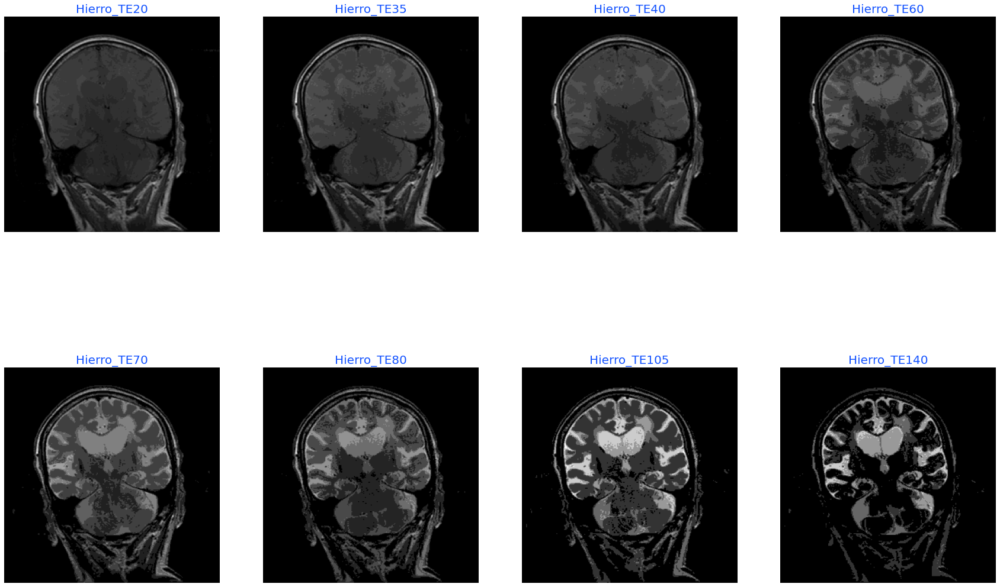

In [26]:
mri_names = [(img_name) for img_name in os.listdir('./materiales/Hierro') if img_name.startswith('Hierro')]
TE = [(int(mri_names[i].split('TE')[1].split('.')[0])) for i in range(len(mri_names))]
names_sorted = [name for _, name in sorted(zip(TE, mri_names))]
TE_sorted = sorted(TE)
mri_imgs = [(cv2.imread('./materiales/Hierro/' + mri, 0)) for mri in names_sorted]

fig = plt.figure(figsize=(30, 20))
for k in range (0,len(mri_imgs)):    
    temp = 241 + k  
    ax = plt.subplot(temp)
    ax.imshow(mri_imgs[k], cmap='gray')
    plt.title(names_sorted[k].split('.')[0], color = '#1453ff', size = 20)
    plt.axis('off')

###  <span style="color:darkcyan"> - Agregar padding a las imágenes para garantizar mismas dimensiones</span>

In [27]:
h, w = mri_imgs[0].shape
mri_imgs = [cv2.copyMakeBorder(mri, h - mri.shape[0], 0, w - mri.shape[1], 0, cv2.BORDER_CONSTANT) for mri in mri_imgs]

###  <span style="color:darkcyan"> - Obtener imágenes parámetricas</span>

En esta sección se obtienen los mapas **R2** y **T2** partiendo de la expresión:

\begin{equation*}
S_i(t) = S_0 \cdot e^{\frac{-TE_i}{T_2}}
\end{equation*}

Donde $S_i$ se asocia a la intensidad de los píxeles de la adquisición y $TE$ representa el tiempo de eco. Para proceder a la obtención de las imágenes paramétricas requeridas, se lleva a cabo una optimización por mínimos cuadrados de la siguiente expresión:

\begin{equation*}
y = A \cdot e^{(B \cdot x)}
\end{equation*}

\begin{equation*}
\ln y = \ln A + B \cdot x
\end{equation*}
    
Donde $A = S_0$, $B = -R2 = -\frac{1}{T_2}$, $x = TE$ e $y = S_i$

Resulta necesario indicar, que para llevar a cabo el proceso de optimización, se consideran todas las imágenes del paciente en cuestión. No obstante, cabe resaltar que con el objetivo de evitar la presencia de indeterminaciones, los valores de intensidad iguales a 0 son descartados.

In [28]:
R2 = np.zeros((h, w))

for i in range(h):
    for j in range(w):
        y = np.array([(mri_imgs[k][i, j]) for k in range(len(mri_imgs))])
        y_refined = np.delete(y, np.where(y == 0))
        x_refined = np.delete(TE_sorted, np.where(y == 0))
        if len(y_refined) >= 2:
            log_y = np.log(y_refined, dtype=np.float64) 
            B, ln_A = np.polyfit(x_refined, log_y, 1, w = np.sqrt(y_refined))
            R2[i, j] = - B

###  <span style="color:darkcyan"> - Normalización de imágenes resultantes y representación de resultados obtenidos</span>

Text(0.5, 1.0, 'T2 (normalizado)')

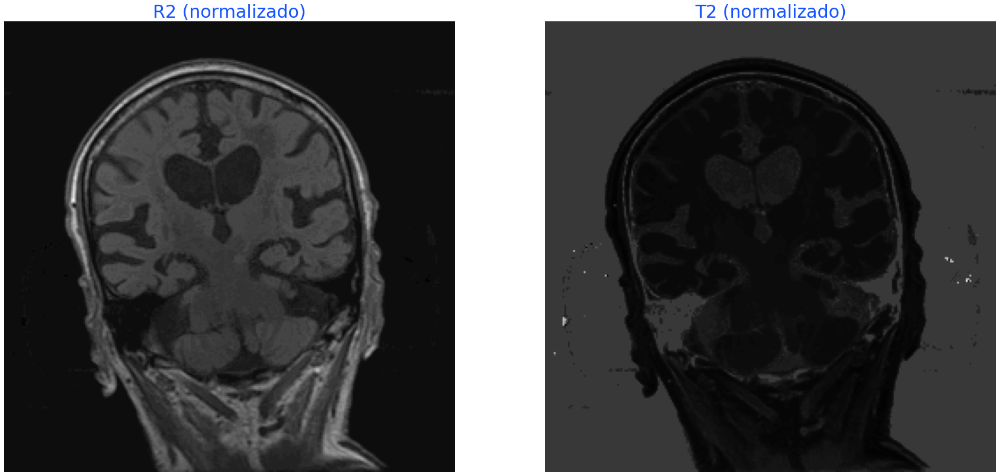

In [29]:
R2_norm = (R2 - np.min(R2)) / (np.max(R2) - np.min(R2)) 
R2_norm = (R2_norm * 255).astype(np.uint8)

T2 = np.zeros((h, w))
T2[R2_norm != 0] =  1 / R2_norm[R2_norm != 0]
T2_norm = (T2 * 255).astype(np.uint8)


plt.figure(figsize=(30, 20))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(R2_norm, cmap='gray')
plt.title('R2 (normalizado)', color='#1453ff', size=30)

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(T2_norm, cmap='gray')
plt.title('T2 (normalizado)', color='#1453ff', size=30)



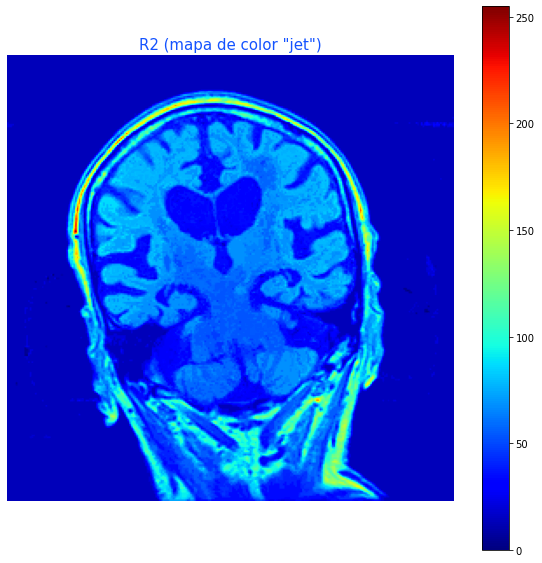

In [30]:
plt.figure(figsize=(10, 10))

plt.imshow(R2_norm, cmap='jet')
plt.axis('off')
plt.title('R2 (mapa de color "jet")', color='#1453ff', size=15)
plt.colorbar()
